In [1]:
import os
import sys
import katcali
print(katcali.__version__)
import mkssins
from mkssins import *
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import matplotlib as mpl
mpl.rcParams['font.size'] = 20
mpl.rcParams['figure.facecolor'] = 'white' # in plt.savefig transparent=True
import katcali.io as kio

import matplotlib.cm as cm
import matplotlib.colors as colors
import datetime as dt
from datetime import timezone, timedelta
import matplotlib.dates as mdates


3.0.9


# Parameters
Block = '1630519596'
pol = 'h'

In [3]:
fname =  Block
path = '/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/'

In [4]:
fload=kio.load_data(fname)
freqs = fload.freqs

In [5]:
print(fload)

Name: 1631387336_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: file:///idia/projects/hi_im/MEERKLASS-1/SCI-20210212-MS-01/1631387336/1631387336/1631387336_sdp_l0.full.rdb
Observer: Sean Passmoor  Experiment ID: 20210911-0009
Description: 'HI Intensity observation RISING epoch 3'
Observed from 2021-09-11 21:09:12.825 SAST to 2021-09-11 23:05:49.865 SAST
Dump rate / period: 0.50021 Hz / 1.999 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m044,m045,m046,m047,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m059,m061,m062,m063  124      248
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 L    c856M4k    1284.000         856

In [6]:
#just checking the mkssins.py module

ants = mkssins.ants_checked_L1(fname, path, pol)
for ant in ants:
    print(ant)
 

m000
m002
m005
m008
m009
m010
m011
m012
m018
m021
m028
m029
m040
m041
m042
m046
m047
m051
m053
m054
m056
m057
m058
m059
m061
m062


In [7]:
target,c0,bad_ants,flux_model=kio.check_ants(fname)

bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


In [8]:
antenna=[]
for i in np.array(kio.ant_list(fload)):
    if i not in bad_ants:
        antenna.append(i)
    else:
        print (str(i) + ' is bad')
print (antenna)

['m000', 'm001', 'm002', 'm003', 'm004', 'm005', 'm006', 'm007', 'm008', 'm009', 'm010', 'm011', 'm012', 'm013', 'm014', 'm015', 'm016', 'm017', 'm018', 'm019', 'm020', 'm021', 'm023', 'm024', 'm025', 'm026', 'm027', 'm028', 'm029', 'm030', 'm031', 'm032', 'm033', 'm034', 'm035', 'm036', 'm037', 'm038', 'm039', 'm040', 'm041', 'm042', 'm043', 'm044', 'm045', 'm046', 'm047', 'm048', 'm049', 'm050', 'm051', 'm052', 'm053', 'm054', 'm055', 'm056', 'm057', 'm058', 'm059', 'm061', 'm062', 'm063']


In [9]:
%time

raw_vis_dict = {}
nd_flags_dict ={}
ps_flags_dict={}
l0_flags_dict = {}

for a in antenna:
    vis,nd_s0, ps, flags = mkssins.visData(fname, a , pol) # replace ant[0] and remove loop for extracting the antenna as a string from the list
    raw_vis_dict[a] = vis
    nd_flags_dict[a] = nd_s0
    ps_flags_dict[a] = ps
    l0_flags_dict[a] = flags

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 9.06 µs


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m000h' 'm000h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m001h' 'm001h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m002h' 'm002h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m003h' 'm003h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m004h' 'm004h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m005h' 'm005h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m006h' 'm006h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m007h' 'm007h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m008h' 'm008h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m009h' 'm009h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m010h' 'm010h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m011h' 'm011h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m012h' 'm012h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m013h' 'm013h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m014h' 'm014h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m015h' 'm015h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m016h' 'm016h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m017h' 'm017h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m018h' 'm018h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m019h' 'm019h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m020h' 'm020h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m021h' 'm021h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m023h' 'm023h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m024h' 'm024h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m025h' 'm025h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m026h' 'm026h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m027h' 'm027h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m028h' 'm028h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m029h' 'm029h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m030h' 'm030h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m031h' 'm031h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m032h' 'm032h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m033h' 'm033h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m034h' 'm034h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m035h' 'm035h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m036h' 'm036h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m037h' 'm037h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m038h' 'm038h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m039h' 'm039h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m040h' 'm040h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m041h' 'm041h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m042h' 'm042h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m043h' 'm043h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m044h' 'm044h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m045h' 'm045h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m046h' 'm046h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m047h' 'm047h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m048h' 'm048h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m049h' 'm049h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m050h' 'm050h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m051h' 'm051h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m052h' 'm052h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m053h' 'm053h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m054h' 'm054h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m055h' 'm055h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m056h' 'm056h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m057h' 'm057h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m058h' 'm058h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m059h' 'm059h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m061h' 'm061h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m062h' 'm062h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s


bad_ants: []
calibrator number = 1
calibrator: PKS1934-638, ra,dec= 294d51m15.39s, -63d42m45.6264s
m063 is bad
# loaded data was saved in python2
['m063h' 'm063h']


edge number 0-359
*** diode 0 was fired out of timestamps list: -17.58448338508606 not in [0,6995.040696144104]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


In [10]:
ant0= antenna[0]

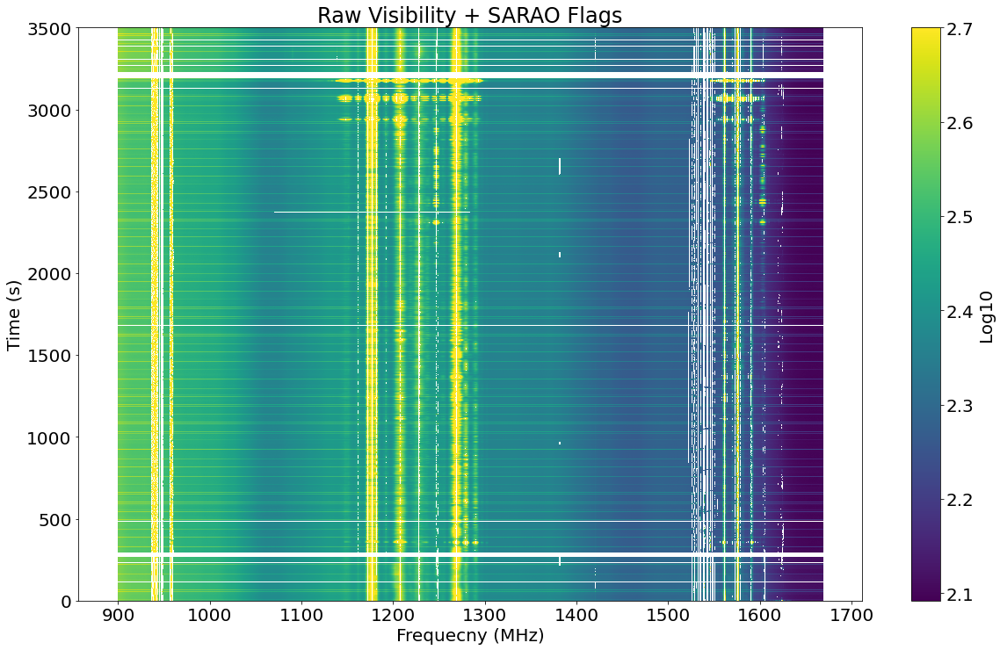

In [11]:
mpl.rcParams['font.size'] = 20

figure, ax = plt.subplots(figsize=(20,12))
plt.imshow(np.ma.array(data = np.log10(raw_vis_dict[ant0]), mask = l0_flags_dict[ant0]), vmax=2.7, aspect='auto', interpolation='none',  extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis_dict[ant0][:,:])))
plt.title(f'Raw Visibility + SARAO Flags')
plt.colorbar(label = 'Log10')
plt.xlabel('Frequecny (MHz)')
plt.ylabel('Time (s)')
plt.savefig('raw_vis_sarao_only.png', transparent=True)

In [12]:
# making the flag plot with SAST

# Convert unix to local time
local_time = list(map(dt.datetime.fromtimestamp, fload.timestamps))

# Convert datetime.datetime objects to the correct matplolib  format
local_t = mdates.date2num(local_time)

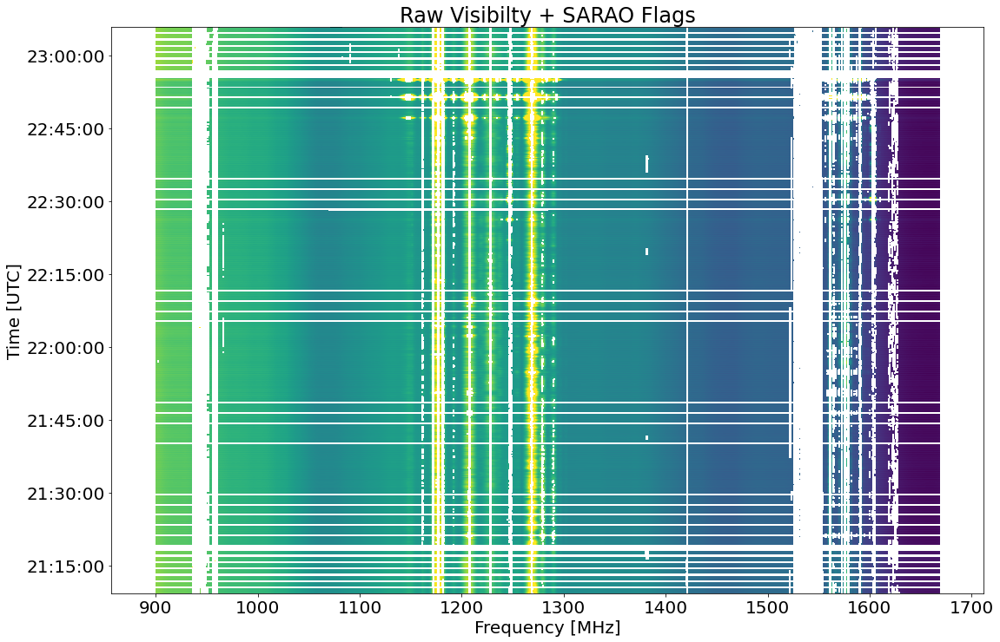

In [13]:
fig, ax = plt.subplots(figsize=(18, 12))  # Fixed size

im = ax.imshow(np.ma.array(data = np.log10(raw_vis_dict[ant0]), mask = l0_flags_dict[ant0]), vmax=2.7,
    aspect='auto',
    extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]]
)

ax.set_xlabel('Frequency [MHz]')
ax.set_ylabel('Time [UTC]')
ax.yaxis_date()
ax.set_title('Raw Visibilty + SARAO Flags')
date_format = mdates.DateFormatter('%H:%M:%S')
ax.yaxis.set_major_formatter(date_format)

# Add colorbar
#cax = fig.add_axes([0.92, 0.12, 0.02, 0.75])
#cb = fig.colorbar(im, cax=cax)
#cb.set_label('Fraction of baselines flagged')

plt.show()

In [14]:
from collections import defaultdict #stackexchange suggestion

l0_flag_add = l0_flags_dict
raw_vis = raw_vis_dict
nd_flags = nd_flags_dict
dd = defaultdict(list)

for d in (l0_flag_add, raw_vis, nd_flags ): # you can list as many input dicts as y
    for key, value in d.items():
        dd[key].append(value)
    
#print(dd) # result: defaultdict

In [15]:
def plot_waterfall(x,label=None,  Title =None, ylim : tuple = None, figsize=None, ax=None, vmax=None,vmin=None, interpolation= None, norm=None, extent = None, cmap=None, xlabel=None, ylabel=None, clabel=None):

    if ax is None:  # Create a new figure and axes if not being passed in as a parameter
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    im = ax.imshow(x, label=label, vmax=vmax, vmin=vmin, interpolation=interpolation, cmap='viridis', aspect='auto', norm=norm, extent=extent)
    ax.set_title(Title)
    ax.set_xlabel(xlabel=xlabel)
    ax.set_ylabel(ylabel=ylabel)
    #fig.colorbar(im, ax=ax) 
    plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),ax=ax, label=clabel) 
    
    if ylim is not None:
        ax.set_ylim(*ylim)
    return ax


In [16]:
mask_l0 = {}

for dish, (l0_flags_, vis_data, nd_flags) in dd.items():

    masked_vis = MaskedArrayVisibilityFlags(vis_data, nd_s0=nd_s0, sarao_flags=l0_flags_)
    mask_l0[dish] = masked_vis

In [17]:

abba_l0 = {}
for ant_value,(masked_vis) in mask_l0.items():
    # Applying the function to create SkySubtraction
    visSS_data = abba(masked_vis)
    abba_l0[ant_value] = visSS_data


abba_l0.keys()

ss_l0 = np.stack(list(abba_l0.values()), axis=0)

In [18]:
# should i set the vmin and vmax values, dont we want to see the extremes in the sky subtraction

In [19]:

def mask_to_flags(nd_s0, zscore_mask, ants, pipeline_flags_0=None, pipeline_flags_1=None):

    """This function will return the flags for the raw, non-time differenced data. This function propagates the masks of the outliers found in the z-scores to flags in the Time-Ordered Data (non-time differenced)
    
    Parameters:
    -----------
    zscore_mask: 2D (t, f), boolean array of the outliers for a specific thresholding. (True - Flag Data , False -  Unflagged Data)
    
    Returns:
    -------
    zscore_flags_dict: Returns the flags as a dictionary, can be combined with the older pipline flags (dictionary) 


    """

    shape = list(zscore_mask.shape)

    # Expand z-score flags with time-padding
    flags_new = np.zeros([shape[0] + 3] + shape[1:], dtype=bool)
    flags_new[:-3] = zscore_mask
    flags_new[3:] |= flags_new[:-3]

    # Start with all NaNs
    flags_float = np.full_like(flags_new, np.nan, dtype=float)

    # Set flagged points to 1.0
    flags_float[flags_new] = 1.0

    # Set nd_s0 rows to 0.0 (explicitly unflagged and visible)
    flags_float[nd_s0, :] = 0.0

    # Apply pipeline_flags_0 as additional flags (set to 1.0)
    if pipeline_flags_0 is not None:
        pipeline_flags_0 = stacked_flags(pipeline_flags_0, ants).astype(bool)
        combined_flags = np.logical_or(pipeline_flags_0, flags_new)
        flags_float[combined_flags] = np.nan

    # Apply pipeline_flags_1 as NaNs (hide regions)
    if pipeline_flags_1 is not None:
        pipeline_flags_1 = stacked_flags(pipeline_flags_1, ants).astype(bool)
        flags_float[pipeline_flags_1] = np.nan

    return flags_float


def stacked_flags(pipeline_flags, ants):
    """This function create a combined mask by summing the flags accross recievers and taking a relevant score
    Parameters:
    -----------
    score == 59
    pipeline_flags: dict of the pipelines flags for each receiver in the observation block
    
    Return:
    -------
    stacked_flag: 2D nd.array (t,f)
    
    """
    
    stacked_flags = np.stack(list(pipeline_flags.values()), axis=0)
    stacked_int_flags = stacked_flags.astype(int)
    stacked_score= np.sum(stacked_int_flags, axis=0)
    stacked_flag = ((stacked_score.astype(float) >= len(ants)-1)) 
    return stacked_flag

def cal_zscore(SS_all_spectrums, ssins_flags = None):

    """ This fuction calculates the z-scores.
    Parameters:
    ----------
    SS_all_spectrums: Array of all antenna sky subtraction spectrums, has the shape (no.Dishes, Time, Frequency)
    
    Returns:
    --------

    z_score: 2D array of the normalised Incoherent Spectrum.
    
    """
    if ssins_flags is None:
        IncoherentSpectrum = np.nanmean(np.abs(SS_all_spectrums), axis=0)
    
    else:
        new_ins = np.ma.array(data =  np.nanmean(np.abs(SS_all_spectrums), axis=0), mask = ssins_flags, fill_value=np.nan)
        IncoherentSpectrum = new_ins.filled()
        
    no_dishes = SS_all_spectrums.shape[0]
    c_fold = np.pi / 2 - 1                            #Auto C_fold Ratio
    meanEst = np.nanmean(IncoherentSpectrum, axis=0) #Time axis averaged MeanEstimate
    std_sq = c_fold*meanEst**2 
   
    z_score = ((IncoherentSpectrum-meanEst))/np.sqrt(std_sq/no_dishes)
   
    
    return z_score     


def count_mean_flags(flag, flag_extra=None, nreceiver=None): 

    """This function calculates the flag percentage accross freqeuncy and time channels.
    int(True) = 1
    int(False) = 0
    This fuction takes the sum for each access using these Boolean 
    Parameters:
    flag: Boolean Array, with shape (nrec, Time, Frequency)
    nreceiver: int
    """
    flag_counts = {}
    if flag_extra is None and flag.ndim == 3:
        flags_fchan = 100*(np.sum(flag, axis=(0,1))/(flag.shape[1]*flag.shape[0]))
        flags_tchan = 100*(np.sum(flag, axis=(0,2))/(flag.shape[2]*flag.shape[0]))
        flag_counts = {'flags_fchan': flags_fchan, 'flags_tchan': flags_tchan}
    return flag_counts

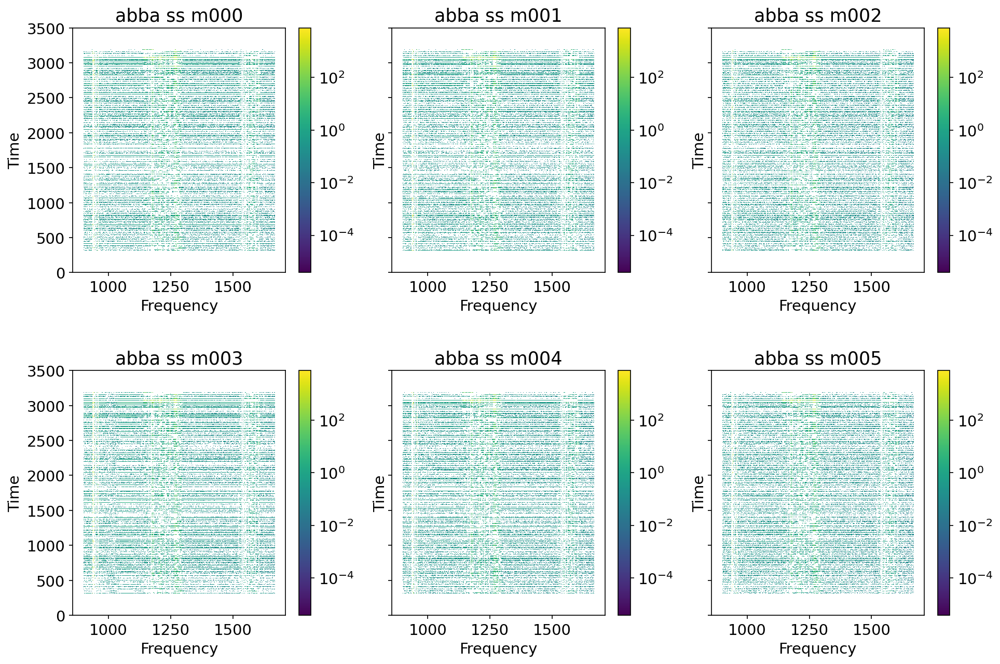

In [20]:
mpl.rcParams['font.size'] = 14
from matplotlib.colors import LogNorm

norm = LogNorm()
rows = 2 #2
columns = 3

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(columns*5, rows*5), sharey=True, dpi=150)
[plot_waterfall((abba_l0[ant_value]), ax=ax, Title=f'abba ss {ant_value}', interpolation='none', norm=norm, xlabel='Frequency' , ylabel = 'Time', extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis[ant][:, :]))) for ant_value, ax in zip(abba_l0, axes.flat) if ant_value in abba_l0]
plt.subplots_adjust(hspace= 0.4)
#plt.savefig('abba_ss')

In [21]:
SS_all_ants = ss_l0
z_score_map_abba_l0 = cal_zscore(ss_l0)

In [22]:
def plot_waterfall(x,label=None,  Title =None, ylim : tuple = None, figsize=None, ax=None, vmax=None,vmin=None, interpolation= None, norm=None, extent = None, cmap=None, xlabel=None, ylabel=None, clabel=None):

    if ax is None:  # Create a new figure and axes if not being passed in as a parameter
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    im = ax.imshow(x, label=label, vmax=vmax, vmin=vmin, interpolation=interpolation, cmap=cmap, aspect='auto', norm=norm, extent=extent)
    ax.set_title(Title)
    ax.set_xlabel(xlabel=xlabel)
    ax.set_ylabel(ylabel=ylabel)
    #fig.colorbar(im, ax=ax) 
    plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),ax=ax, label=clabel) 
    
    if ylim is not None:
        ax.set_ylim(*ylim)
    return ax


<AxesSubplot:title={'center':'Noise Spectrum SSINS Round 1'}, xlabel='Frequency Chan', ylabel='Time Chan'>

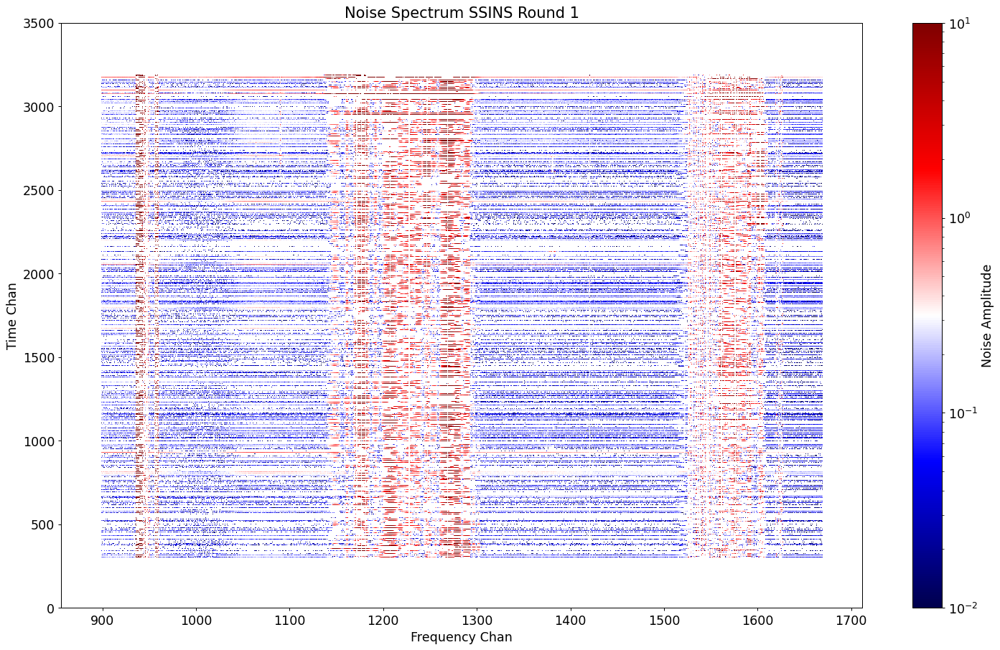

In [23]:
norm_noise = LogNorm(vmin=1e-2, vmax=1e1)


figure, ax = plt.subplots(1, 1 , figsize=(20, 12), dpi=90)
plot_waterfall(np.nanmean(ss_l0, axis=0), Title = 'Noise Spectrum SSINS Round 1', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='nearest',clabel='Noise Amplitude', extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis[ant][:, :])), norm=norm_noise,cmap='seismic', ax=ax)

In [24]:
ssins_l0_zscore_mask = ((z_score_map_abba_l0.astype(float) < -9.5) ^ (z_score_map_abba_l0.astype(float) > 9.5) )

In [25]:
def mask_to_flags(nd_s0, zscore_mask, ants, pipeline_flags_0=None, pipeline_flags_1=None):

    """This function will return the flags for the raw, non-time differenced data. This function propagates the masks of the outliers found in the z-scores to flags in the Time-Ordered Data (non-time differenced)
    
    Parameters:
    -----------
    zscore_mask: 2D (t, f), boolean array of the outliers for a specific thresholding. (True - Flag Data , False -  Unflagged Data)
    
    Returns:
    -------
    zscore_flags_dict: Returns the flags as a dictionary, can be combined with the older pipline flags (dictionary) 


    """

    shape = list(zscore_mask.shape)

    # Expand z-score flags with time-padding
    flags_new = np.zeros([shape[0] + 3] + shape[1:], dtype=bool)
    flags_new[:-3] = zscore_mask
    flags_new[3:] |= flags_new[:-3]

    # Start with all NaNs
    flags_float = np.full_like(flags_new, np.nan, dtype=float)

    # Set flagged points to 1.0 of ssins
    flags_float[flags_new] = 1.0

    # Set nd_s0 rows to 0.0 false, unflagged scans of the noise diode off
    flags_float[nd_s0, :] = 0.0

    # Apply pipeline_flags_0 as additional flags (set to 1.0)
    if pipeline_flags_0 is not None:
        pipeline_flags_0 = stacked_flags(pipeline_flags_0, ants).astype(bool)
        combined_flags = np.logical_or(pipeline_flags_0, flags_new)
        flags_float[pipeline_flags_0] = np.nan
        flags_float[flags_new] = 1

    # Apply pipeline_flags_1 as NaNs (hide regions)
    if pipeline_flags_1 is not None:
        pipeline_flags_1 = stacked_flags(pipeline_flags_1, ants).astype(bool)
        combined_flags = np.logical_or(pipeline_flags_0, flags_new)
        flags_float[pipeline_flags_1] = np.nan
        flags_float[flags_new] = 1


    return flags_float

In [26]:
ssins_l0_flags  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=ssins_l0_zscore_mask, pipeline_flags_0= l0_flags_dict)

In [27]:
ssins_l0_flags[:, 2700:2730][nd_s0] = False

In [28]:
# nan the noise diode and nan the flags, leave only the raw ssins flags

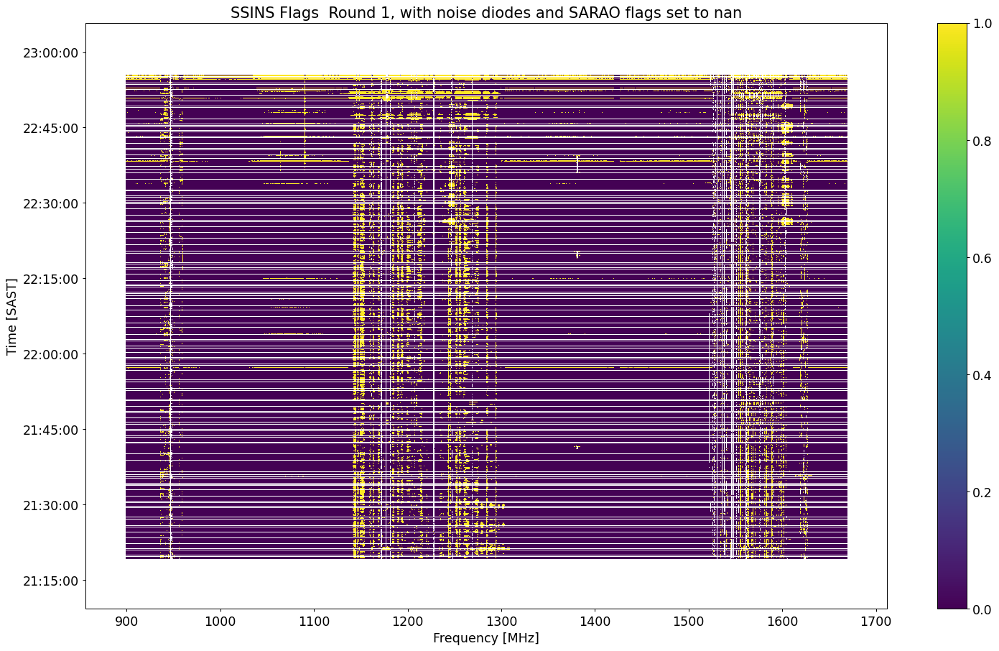

In [29]:

cmap = cm.viridis  # or any other colormap
cmap.set_bad(color='white')  # NaNs will appear white

figure, ax = plt.subplots(1, 1 , figsize=(20, 12), dpi=90, sharey=True)
plot_waterfall(ssins_l0_flags, Title = 'SSINS Flags  Round 1, with noise diodes and SARAO flags set to nan', figsize=(20,12), xlabel='Frequency Chan', interpolation='none', extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]],  ax=ax)
ax.set_xlabel('Frequency [MHz]')
ax.set_ylabel('Time [SAST]')
ax.yaxis_date()

date_format = mdates.DateFormatter('%H:%M:%S')
ax.yaxis.set_major_formatter(date_format)


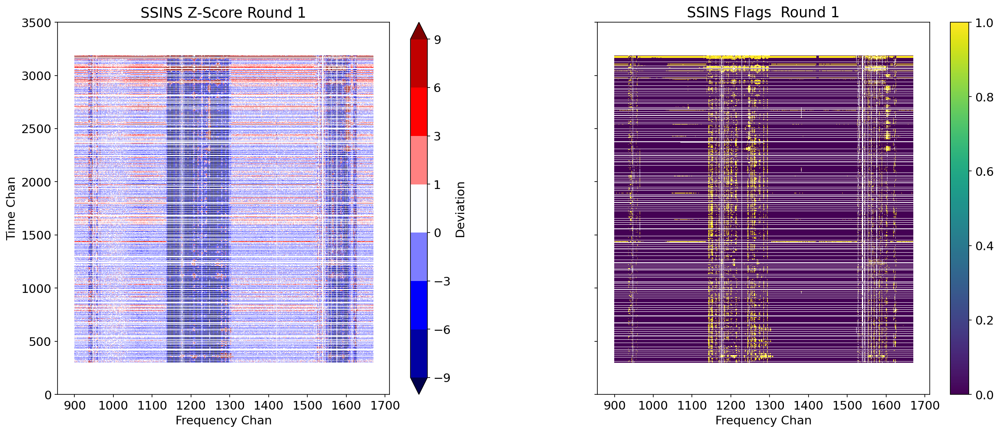

In [30]:

figure, ax = plt.subplots(1, 2 , figsize=(20, 8), dpi=150, sharey=True)
plot_waterfall(ssins_l0_flags, Title = 'SSINS Flags  Round 1', figsize=(20,12), xlabel='Frequency Chan', interpolation='none', extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis[ant][:, :])),  ax=ax[1])


cmap = mpl.cm.viridis
bounds =[-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')
plot_waterfall(z_score_map_abba_l0, Title = 'SSINS Z-Score Round 1', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='none', norm=norm, extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis[ant][:, :])), clabel='Deviation', cmap='seismic',  ax=ax[0])
plt.subplots_adjust(wspace=0.3)

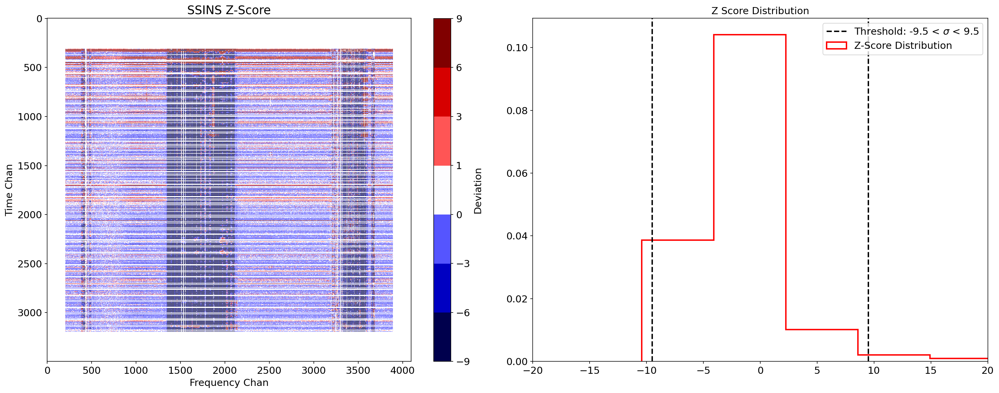

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic

bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(z_score_map_abba_l0, Title='SSINS Z-Score',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(z_score_map_abba_l0), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-9.5, ls='--', color='k', label='Threshold: -9.5 < $\sigma$ < 9.5', linewidth=2)
ax[1].axvline(x=9.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()


In [32]:
ssins_2 = cal_zscore(ss_l0, ssins_flags= ssins_l0_zscore_mask)

In [33]:
ssins_l0_2_mask = ((ssins_2.astype(float) < -5) ^(ssins_2.astype(float) > 5) )

In [34]:
ssins_l0_flags_2  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=np.logical_or(ssins_l0_zscore_mask, ssins_l0_2_mask), pipeline_flags_0= l0_flags_dict)

In [35]:
ssins_l0_flags_2[:, 2700:2730][nd_s0] = False

In [36]:
fload.channel_freqs[880]

1039906250.0

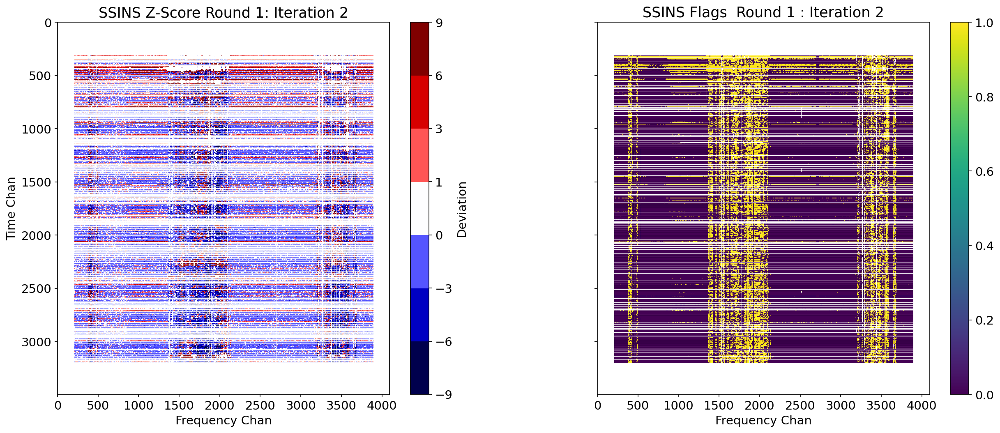

In [37]:

figure, ax = plt.subplots(1, 2 , figsize=(20, 8), dpi=150, sharey=True)
cmap.set_bad(color='white')
plot_waterfall(ssins_l0_flags_2, Title = 'SSINS Flags  Round 1 : Iteration 2', figsize=(20,12), xlabel='Frequency Chan', interpolation='none', ax=ax[1], cmap=cmap.set_bad(color='white'))

bounds =[-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
plot_waterfall(ssins_2, Title = 'SSINS Z-Score Round 1: Iteration 2', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='none', norm=norm, cmap='seismic', clabel='Deviation', ax=ax[0])
plt.subplots_adjust(wspace=0.3)

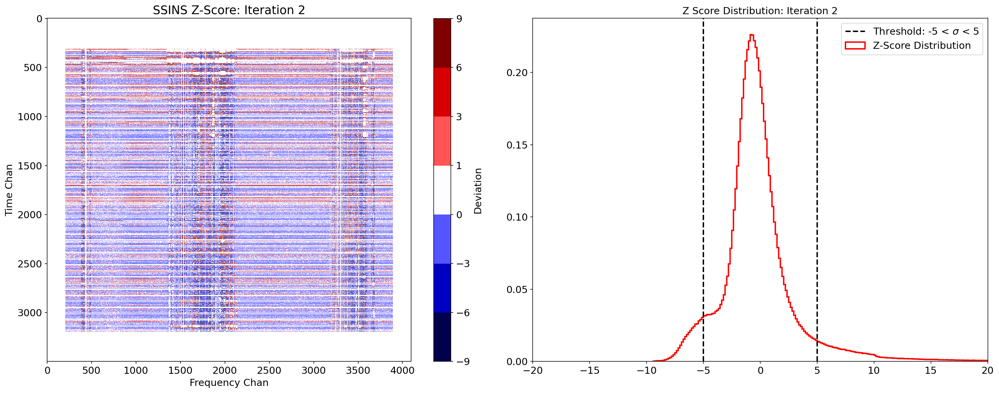

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_2, Title='SSINS Z-Score: Iteration 2',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_2), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-5, ls='--', color='k', label='Threshold: -5 < $\sigma$ < 5', linewidth=2)
ax[1].axvline(x=5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 2', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()


In [39]:
ssins_3= cal_zscore(ss_l0, ssins_flags = np.logical_or(ssins_l0_zscore_mask, ssins_l0_2_mask))

In [40]:
ssins_l0_3_mask = ((ssins_3.astype(float) < -4.5) ^(ssins_3.astype(float) > 4.5) )

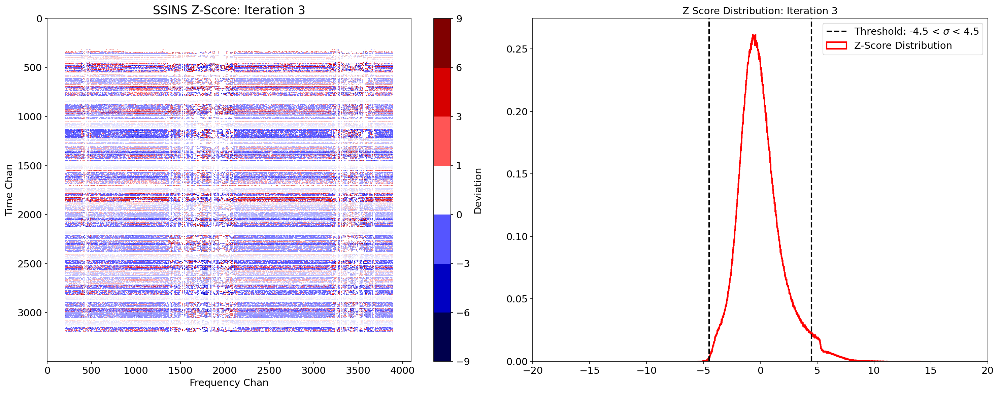

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_3, Title='SSINS Z-Score: Iteration 3',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_3), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 3', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()


In [42]:
ssins_4 = cal_zscore(ss_l0, ssins_flags = np.logical_or(np.logical_or(ssins_l0_zscore_mask, ssins_l0_3_mask), ssins_l0_2_mask))

In [43]:
ssins_l0_4_mask = ((ssins_4.astype(float) < -4.5) ^(ssins_4.astype(float) > 4.5) )

In [44]:
ssins_5 = cal_zscore(ss_l0, ssins_flags = np.logical_or(np.logical_or(np.logical_or(ssins_l0_zscore_mask, ssins_l0_3_mask), ssins_l0_2_mask), ssins_l0_4_mask))

In [45]:
ssins_l0_flags_5  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=np.logical_or(np.logical_or(np.logical_or(ssins_l0_zscore_mask, ssins_l0_3_mask), ssins_l0_2_mask), ssins_l0_4_mask), pipeline_flags_0= l0_flags_dict)

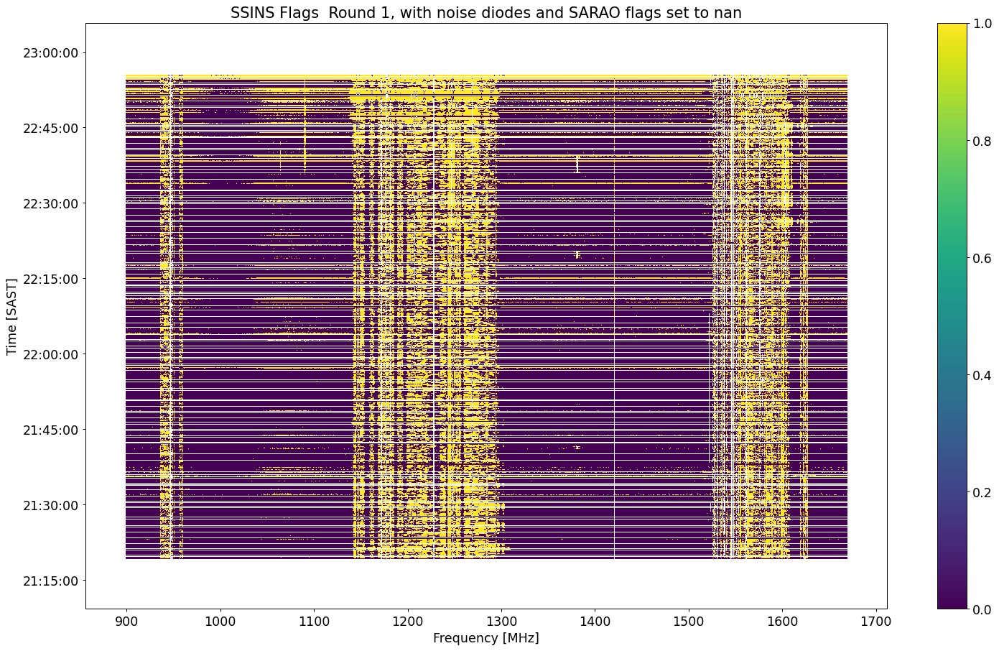

In [46]:
cmao = cm.viridis  # or any other colormap
cmap.set_bad(color='white')  # NaNs will appear white

figure, ax = plt.subplots(1, 1 , figsize=(20, 12), dpi=90, sharey=True)
plot_waterfall(ssins_l0_flags_5, Title = 'SSINS Flags  Round 1, with noise diodes and SARAO flags set to nan', figsize=(20,12), xlabel='Frequency Chan', interpolation='none', extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]],  ax=ax)
ax.set_xlabel('Frequency [MHz]')
ax.set_ylabel('Time [SAST]') 
ax.yaxis_date()

date_format = mdates.DateFormatter('%H:%M:%S')
ax.yaxis.set_major_formatter(date_format)

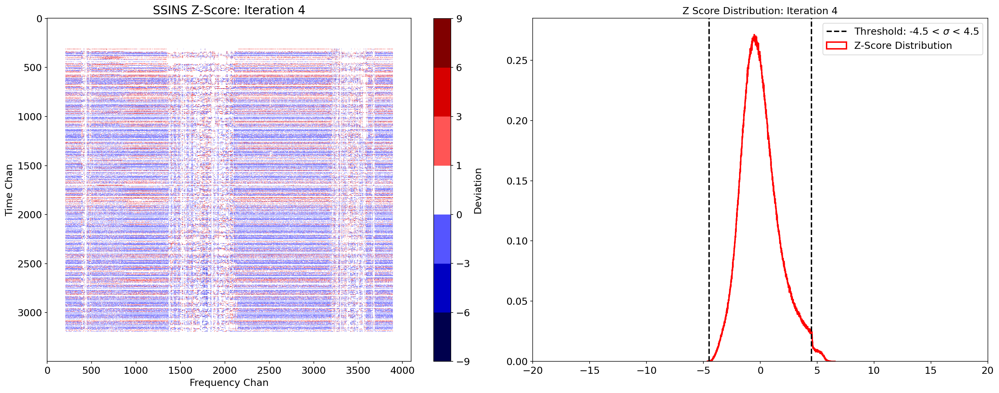

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cmap.set_bad(color='white') 
# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_4, Title='SSINS Z-Score: Iteration 4',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_4), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 4', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()


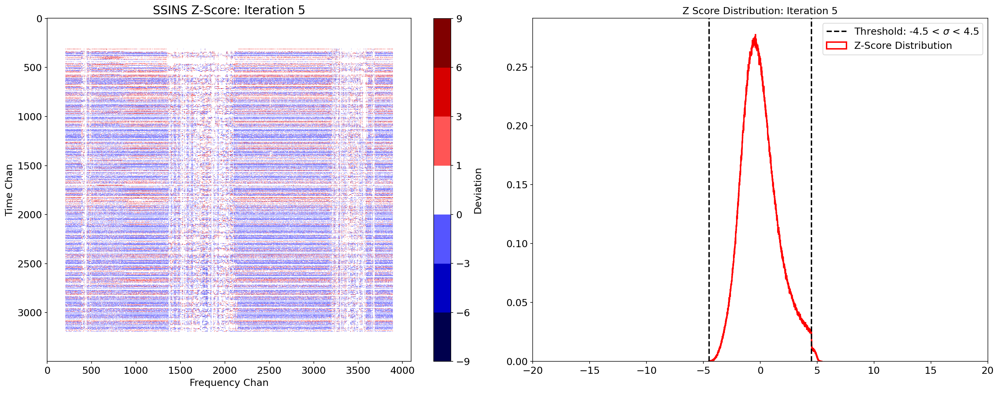

In [48]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cmap.set_bad(color='white') 
# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_5, Title='SSINS Z-Score: Iteration 5',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_5), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 5', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()


In [49]:
# Galactic HI Check:


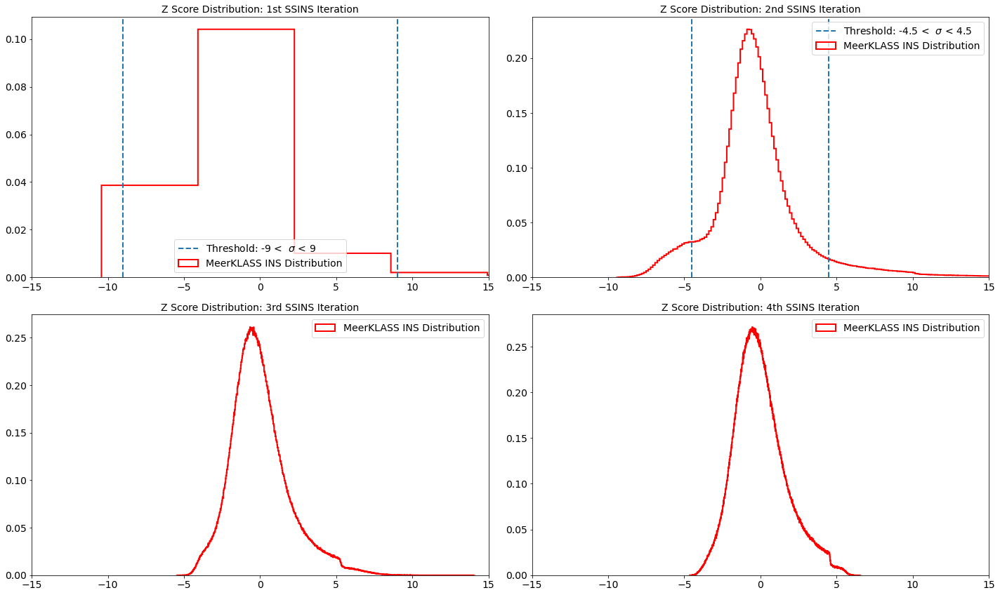

In [50]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Define histogram data and titles
ssins_data = [z_score_map_abba_l0, ssins_2, ssins_3, ssins_4]
titles = [
    'Z Score Distribution: 1st SSINS Iteration',
    'Z Score Distribution: 2nd SSINS Iteration',
    'Z Score Distribution: 3rd SSINS Iteration',
    'Z Score Distribution: 4th SSINS Iteration'
]
bins = [1000, 1000, 1000, 1000]  # Different bin sizes for different iterations

for i, ax in enumerate(axes.flat):
    ax.hist(np.ravel(ssins_data[i]), bins=bins[i], histtype='step', density=True, 
            edgecolor='r', label='MeerKLASS INS Distribution', linewidth=2)
    if i == 0:
        ax.axvline(x=-9, ls='--', label='Threshold: -9 <  $\sigma$ < 9', linewidth=2)
        ax.axvline(x=9, ls='--', linewidth=2)
        
    if 0 < i < 2:  # Add vertical threshold lines only for the first two plots
        ax.axvline(x=-4.5, ls='--', label='Threshold: -4.5 <  $\sigma$ < 4.5', linewidth=2)
        ax.axvline(x=4.5, ls='--', linewidth=2)
    
    ax.set_xlim((-15, 15))
    ax.set_title(titles[i], fontsize=14)
    ax.legend()

plt.tight_layout()
plt.show()


# Explain the sudden clip in the last zscore

Hoe does the MWZ SSINS flagger work, that the clipping does not leave this same of cutting artifact, ie the abrupt cut on the right of the z-score distribution?

In [51]:
def mask_to_flags_ssins(nd_s0, zscore_mask, ants):

    shape = list(zscore_mask.shape)

    # Expand z-score flags with time-padding
    flags_new = np.zeros([shape[0] + 3] + shape[1:], dtype=bool)
    flags_new[:-3] = zscore_mask
    flags_new[3:] |= flags_new[:-3]
    return flags_new


In [52]:
ssins_l0_flags_only = mask_to_flags_ssins(nd_s0, ants=antenna, zscore_mask=np.logical_or(np.logical_or(np.logical_or(ssins_l0_zscore_mask, ssins_l0_3_mask), ssins_l0_2_mask), ssins_l0_4_mask))

mask2 loaded for dish m000
mask2 loaded for dish m002
mask2 loaded for dish m005
mask2 loaded for dish m008
mask2 loaded for dish m009
mask2 loaded for dish m010
mask2 loaded for dish m011
mask2 loaded for dish m012
mask2 loaded for dish m018
mask2 loaded for dish m021
mask2 loaded for dish m028
mask2 loaded for dish m029
mask2 loaded for dish m040
mask2 loaded for dish m041
mask2 loaded for dish m042
mask2 loaded for dish m046
mask2 loaded for dish m047
mask2 loaded for dish m051
mask2 loaded for dish m053
mask2 loaded for dish m054
mask2 loaded for dish m056
mask2 loaded for dish m057
mask2 loaded for dish m058
mask2 loaded for dish m059
mask2 loaded for dish m061
mask2 loaded for dish m062


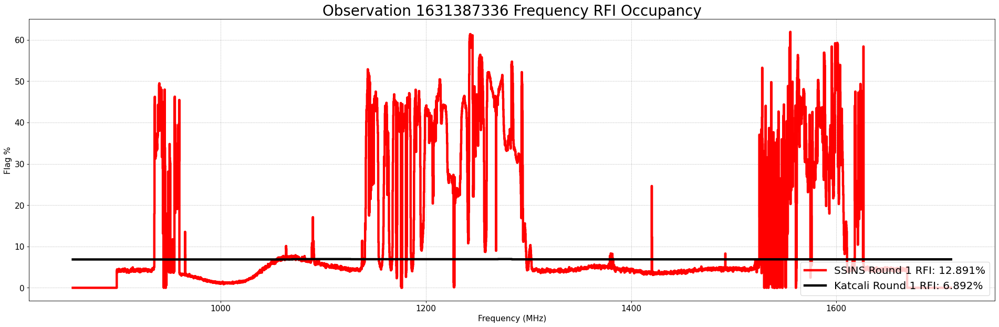

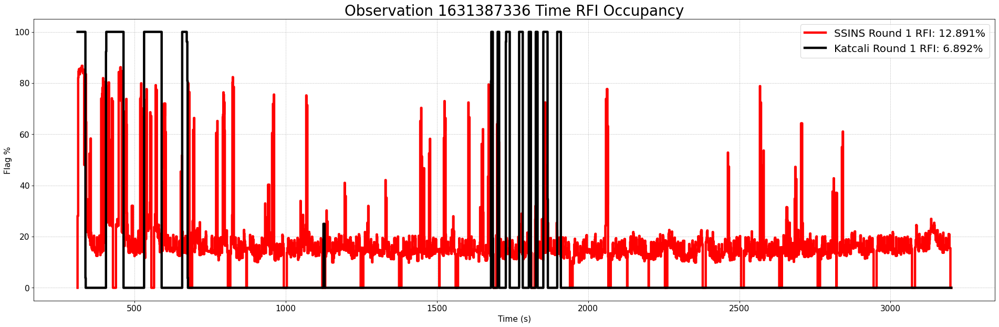

In [53]:
path_l1 = '/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/'
f = fname
data_file = kio.load_data(f)
freqs = data_file.freqs
chans = data_file.channels
dumps = data_file.dumps

l1_flags, nrec = l1_flags_dict_to_array(fname=f'{f}', pol='h', path=path_l1)
katcali_flag_counts_l1 = count_flags((l1_flags))
ssins_only_flag_counts_l1 = count_flags(ssins_l0_flags_only, nreceiver=nrec)
ssins_f = np.mean(ssins_only_flag_counts_l1['flags_fchan'])
katcali_f = np.mean(katcali_flag_counts_l1['flags_fchan'])

ssins_t = np.mean(ssins_only_flag_counts_l1['flags_tchan'])
katcali_t = np.mean(katcali_flag_counts_l1['flags_tchan'])

plt.figure(figsize=(24, 8), dpi=80)
plt.step(freqs[chans]/1e6, ssins_only_flag_counts_l1['flags_fchan'], label=f'SSINS Round 1 RFI: {ssins_f:.3f}%', linewidth=4, color='r')
plt.step(freqs[chans]/1e6, katcali_flag_counts_l1['flags_fchan'], label=f'Katcali Round 1 RFI: {katcali_f:.3f}%', linewidth=4, color='k')
plt.grid(ls=':', color='#6e6e6e', lw=0.5)
plt.ylabel('Flag %', color='k')
plt.title(f'Observation {f} Frequency RFI Occupancy', fontsize=25)
plt.legend(fontsize=18, labelcolor='k', loc='lower right')
plt.xlabel('Frequency (MHz)', color='k')
plt.tight_layout()
freq_plot_path = os.path.join('plots/ssins_r1/', f'flag_percentage_freq_ssinsround1_{f}.png')
#plt.savefig(freq_plot_path)
plt.show()

# --- Time Plot (tchan) ---
plt.figure(figsize=(24, 8), dpi=80)
plt.step(dumps[nd_s0], ssins_only_flag_counts_l1['flags_tchan'][nd_s0], label=f'SSINS Round 1 RFI: {ssins_t:.3f}%', linewidth=4, color='r')
plt.step(dumps[nd_s0], katcali_flag_counts_l1['flags_tchan'][nd_s0], label=f'Katcali Round 1 RFI: {katcali_t:.3f}%', linewidth=4, color='k')
plt.grid(ls=':', color='#6e6e6e', lw=0.5)
plt.xlabel('Time (s)', color='k')
plt.ylabel('Flag %', color='k')
plt.title(f'Observation {f} Time RFI Occupancy', fontsize=25)
plt.legend(fontsize=18, labelcolor='k', loc='upper right')
plt.tight_layout()
#time_plot_path = os.path.join('plots/ssins_r1/', f'flag_percentage_time_ssinsround1_{f}.png')
#plt.savefig(time_plot_path)
plt.show()

In [54]:
directory = 'meerklass-ssins/ssins_iterative_flags/ssins_level0/'
file_path = os.path.join(directory, f'{fname}_{pol}_ssins_Level0_flags.npy')

# Save the file
with open(file_path, 'wb') as f:
    np.save(f, ssins_l0_flags_only)


FileNotFoundError: [Errno 2] No such file or directory: 'meerklass-ssins/ssins_iterative_flags/ssins_level0/1631387336_h_ssins_Level0_flags.npy'

In [ ]:
"""directory = 'ssins_iterative_flags/ssins_level0/zscore'
file_path = os.path.join(directory, f'{fname}_{pol}_ssins_level0_zscore.npy')

# Save the file
with open(file_path, 'wb') as f:
    np.save(f,ssins_5)"""


In [55]:
ants = mkssins.ants_checked_L1(fname, path, pol)
for ant in ants:
    print(ant)

m000
m002
m005
m008
m009
m010
m011
m012
m018
m021
m028
m029
m040
m041
m042
m046
m047
m051
m053
m054
m056
m057
m058
m059
m061
m062


In [56]:
ant0=ants[0]

In [57]:
[key for key in raw_vis_dict.keys() if key in ants]
raw_vis_dict_r2 = {key: raw_vis_dict[key] for key in raw_vis_dict if key in ants}
nd_flags_dict_r2 = {key: nd_flags_dict[key] for key in raw_vis_dict if key in ants}

In [58]:
from pathlib import Path
import pickle

mask_dir = Path('/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/')
l1_flags_dict = {}

# Loop over dishes and load corresponding mask file
for dish, vis in raw_vis_dict.items():
    fname_mask2 = mask_dir / f'{fname}_{dish}_mask2'
    print(fname_mask2)
    fname_mask = mask_dir / f'{fname}_{dish}_mask'
    print(fname_mask)

    # Try to use mask2, else fallback to mask
    if fname_mask2.exists():
        with open(fname_mask2, 'rb') as f:
            d3 = pickle.load(f)
        print(f'mask2 loaded for dish {dish}')
    elif fname_mask.exists():
        with open(fname_mask, 'rb') as f:
            d3 = pickle.load(f)
        print(f'mask loaded for dish {dish}')
    else:
        print(f'❌ No mask found for dish {dish}')
        continue  # skip this dish

    # Store the loaded mask
    l1_flags_dict[dish] = d3['mask']


/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m000_mask2
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m000_mask
mask2 loaded for dish m000
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m001_mask2
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m001_mask
❌ No mask found for dish m001
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m002_mask2
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m002_mask
mask2 loaded for dish m002
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m003_mask2
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m003_mask
❌ No mask found for dish m003
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m004_mask2
/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/1631387336_m004_mask
❌ No mask found for dish m004
/idia/proje

In [59]:
from collections import defaultdict #stackexchange suggestion

l1_flag = l1_flags_dict
raw_vis = raw_vis_dict_r2
nd_flags = nd_flags_dict_r2
dd = defaultdict(list)

for d in (l1_flag, raw_vis, nd_flags): # you can list as many input dicts as y
    for key, value in d.items():
        dd[key].append(value)
    
print(dd) # result: defaultdict

defaultdict(<class 'list'>, {'m000': [array([[ True,  True,  True, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[284.36096191,  56.55295181,  56.61654282, ...,   0.        ,
          0.        ,   0.        ],
       [296.64892578,  67.32167816,  67.28757477, ...,   0.        ,
          0.        ,   0.        ],
       [283.72015381,  56.44819641,  56.4110527 , ...,  86.47422028,
         86.90628815,  88.27601624],
       ...,
       [328.04504395,  56.49810028,  56.42337036, ...,  83.22042847,
         83.85575867,  84.30020142],
       [326.72918701,  56.09457397,  56.2449379 , ...,  82.58266449,
         83.17127228,  84.00812531],
       [325.43041992,  55.84507751,  56.18651962, ...,  82.51235962,
 

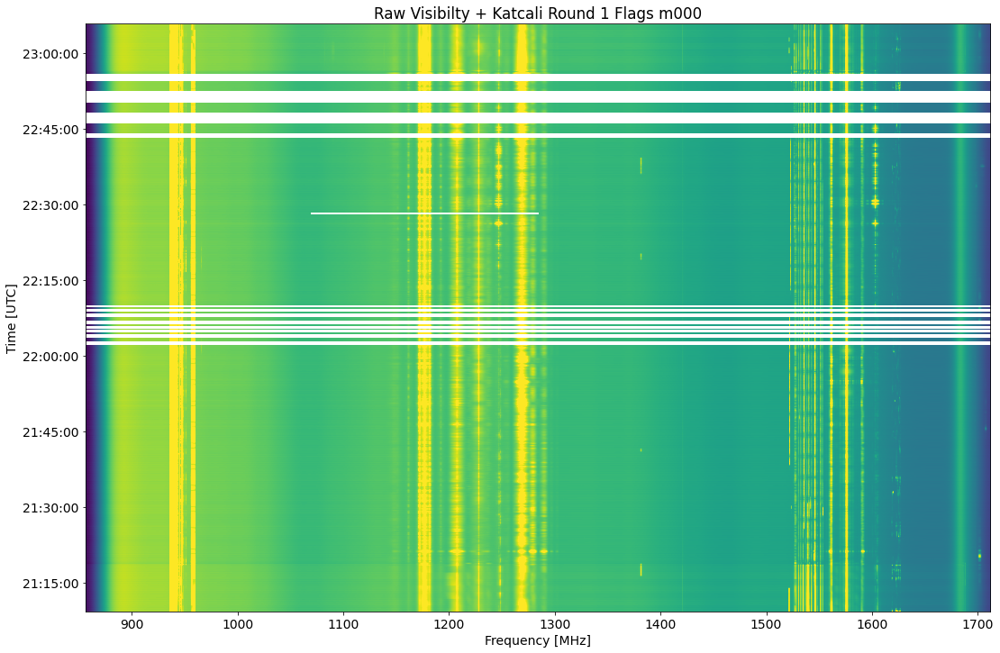

In [60]:
fig, ax = plt.subplots(figsize=(18, 12))  # Fixed size

im = ax.imshow(np.ma.array(data = np.log10(raw_vis_dict[ant0]), mask = l1_flags_dict[ant0]), vmax=2.7,
    aspect='auto',
    extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]]
)

ax.set_xlabel('Frequency [MHz]')
ax.set_ylabel('Time [UTC]')
ax.yaxis_date()
ax.set_title(f'Raw Visibilty + Katcali Round 1 Flags {ant0}')
date_format = mdates.DateFormatter('%H:%M:%S')
ax.yaxis.set_major_formatter(date_format)

# Add colorbar
#cax = fig.add_axes([0.92, 0.12, 0.02, 0.75])
#cb = fig.colorbar(im, cax=cax)
#cb.set_label('Fraction of baselines flagged')

plt.show()

In [61]:
mask_l1 = {}

for dish, (l1_flags_, vis_data, nd_flags) in dd.items():

    masked_vis = MaskedArrayVisibilityFlags(vis_data, nd_s0=nd_s0, pipeline_flags=l1_flags_)
    mask_l1[dish] = masked_vis

In [62]:

abba_l1 = {}
for ant_value,(masked_vis) in mask_l1.items():
    # Applying the function to create SkySubtraction
    visSS_data = abba(masked_vis)
    abba_l1[ant_value] = visSS_data


abba_l1.keys()

ss_l1 = np.stack(list(abba_l1.values()), axis=0)

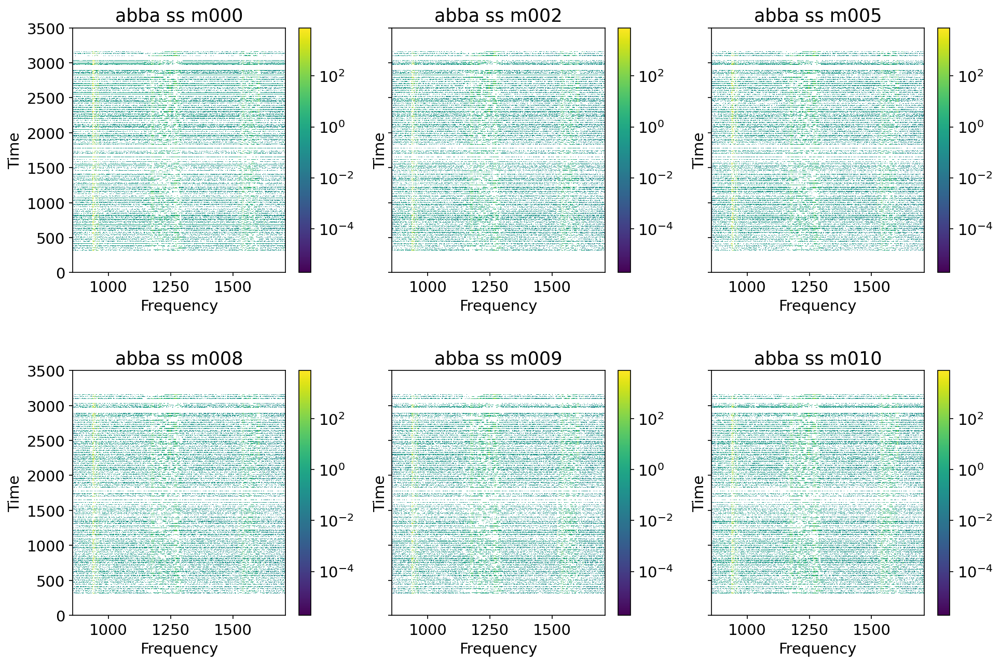

In [63]:
mpl.rcParams['font.size'] = 14
from matplotlib.colors import LogNorm

norm = LogNorm()
rows = 2 #2
columns = 3

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(columns*5, rows*5), sharey=True, dpi=150)
[plot_waterfall((abba_l1[ant_value]), ax=ax, Title=f'abba ss {ant_value}', interpolation='none', norm=norm, xlabel='Frequency' , ylabel = 'Time', extent=(freqs[0]/1e6,freqs[4095]/1e6, 0, len(raw_vis[ant][:, :]))) for ant_value, ax in zip(abba_l1, axes.flat) if ant_value in abba_l1]
plt.subplots_adjust(hspace= 0.4)
#plt.savefig('abba_ss')

In [64]:
SS_all_ants = ss_l1
z_score_map_abba_l1 = cal_zscore(ss_l1)

In [65]:
ssins_l1_zscore_mask = ((z_score_map_abba_l1.astype(float) < -4.5) ^(z_score_map_abba_l1.astype(float) > 4.5) )

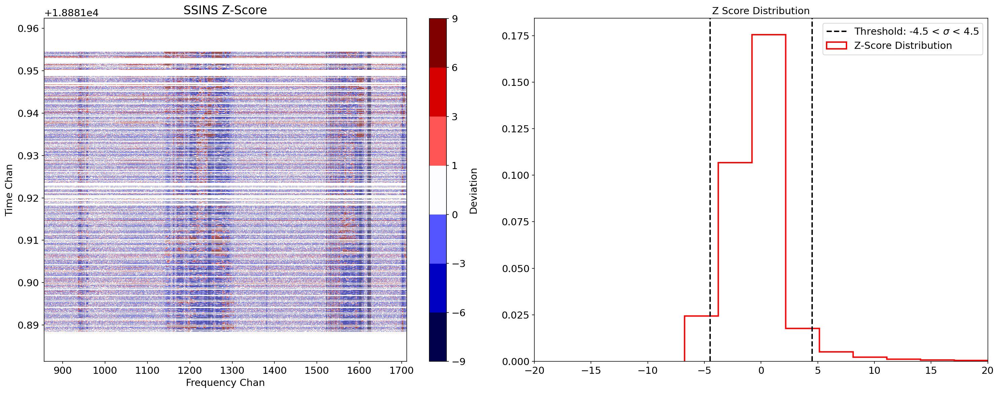

In [82]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(z_score_map_abba_l1, Title='SSINS Z-Score',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0], extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(z_score_map_abba_l1), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()

In [66]:
ssins_l1_flags  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=ssins_l1_zscore_mask, pipeline_flags_1= l1_flags_dict, pipeline_flags_0=l0_flags_dict)

<AxesSubplot:title={'center':'SSINS Z-Score Round 2'}, xlabel='Frequency Chan', ylabel='Time Chan'>

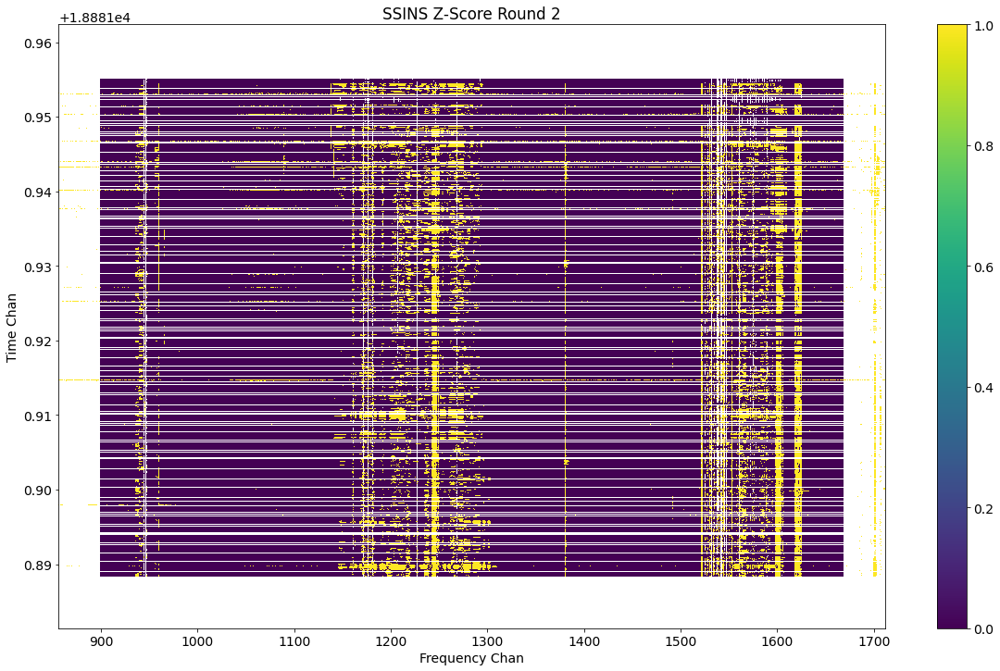

In [88]:
plot_waterfall(ssins_l1_flags, Title = 'SSINS Z-Score Round 2', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='none', extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]])


In [84]:
ssins_2_l1 = cal_zscore(ss_l1, ssins_flags= ssins_l1_zscore_mask)
ssins_l1_2_mask = ((ssins_2_l1.astype(float) < -4.5) ^(ssins_2_l1.astype(float) > 4.5) )
ssins_l1_flags_2  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=np.logical_or(ssins_l1_zscore_mask, ssins_l1_2_mask), pipeline_flags_1= l1_flags_dict)
ssins_l1_flags_2[:, 2700:2730][nd_s0] = False

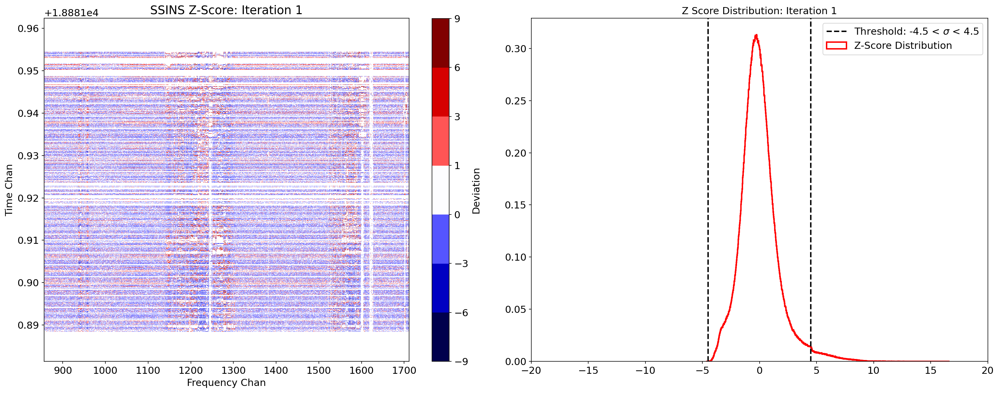

In [85]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_2_l1, Title='SSINS Z-Score: Iteration 1',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0], extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_2_l1), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 1', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()

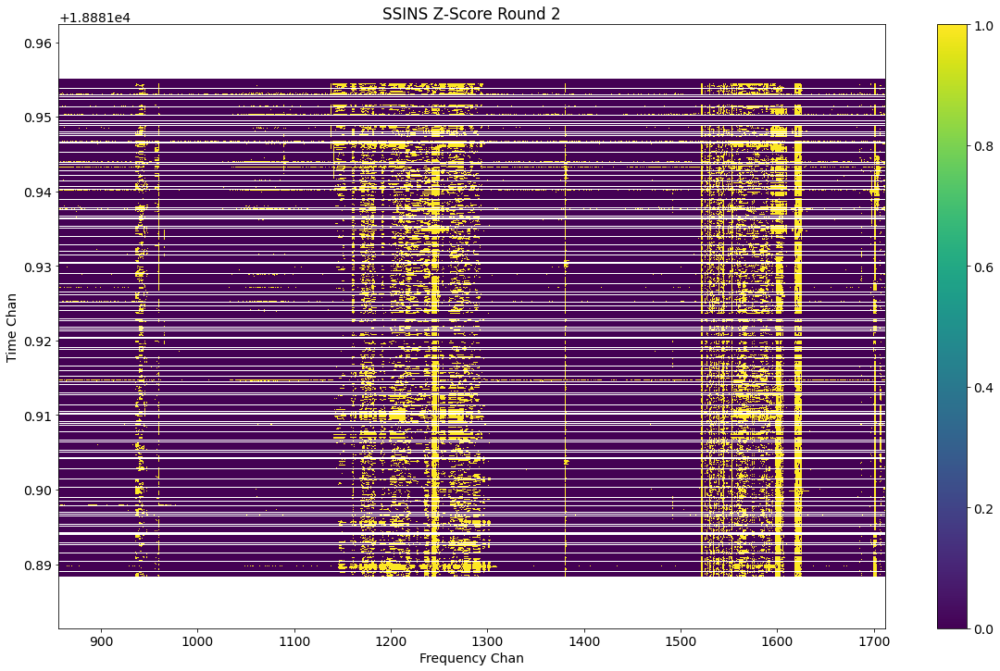

In [94]:
plot_waterfall(ssins_l1_flags_2, Title = 'SSINS Z-Score Round 2', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='none', extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]])


In [91]:
ssins_3_l1 = cal_zscore(ss_l1, ssins_flags= np.logical_or(ssins_l1_2_mask, ssins_l1_zscore_mask))
ssins_l1_3_mask = ((ssins_3_l1.astype(float) < -4.5) ^(ssins_3_l1.astype(float) > 4.5) )
ssins_l1_flags_3  = mask_to_flags(nd_s0, ants=antenna, zscore_mask=np.logical_or(ssins_l1_zscore_mask, np.logical_or(ssins_l1_2_mask, ssins_l1_3_mask)), pipeline_flags_1= l1_flags_dict)
ssins_l1_flags_3[:, 2700:2730][nd_s0] = False

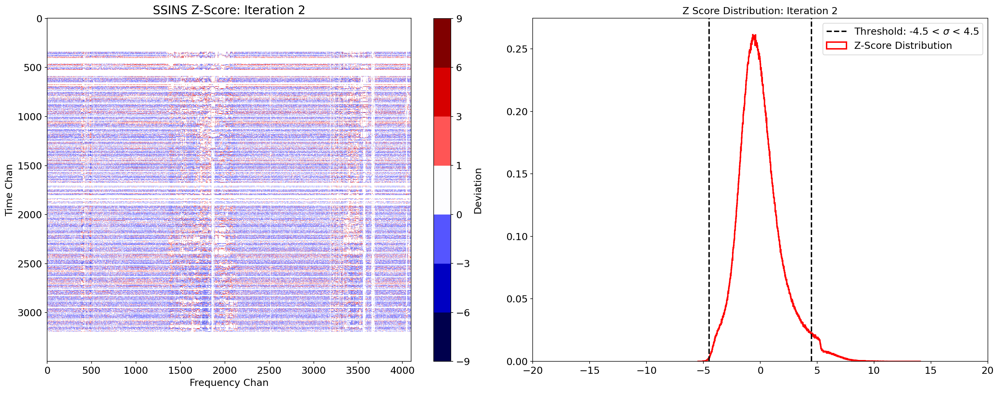

In [92]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Colormap and norm setup for waterfall
cmap = mpl.cm.seismic
bounds = [-9, -6, -3, 0, 1, 3, 6, 9]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# Create the figure
fig, ax = plt.subplots(1, 2, figsize=(20, 8), dpi=150)

# === Left: Waterfall plot ===
plot_waterfall(ssins_3_l1, Title='SSINS Z-Score: Iteration 2',
               figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan',
               interpolation='none', norm=norm, cmap=cmap,
               clabel='Deviation', ax=ax[0])

# === Right: Histogram of z-scores ===

ax[1].hist(np.ravel(ssins_3), bins=1000, histtype='step', density=True,
           edgecolor='r', linewidth=2, label='Z-Score Distribution')
ax[1].axvline(x=-4.5, ls='--', color='k', label='Threshold: -4.5 < $\sigma$ < 4.5', linewidth=2)
ax[1].axvline(x=4.5, ls='--', color='k', linewidth=2)
ax[1].set_xlim((-20, 20))
ax[1].set_title('Z Score Distribution: Iteration 2', fontsize=14)
ax[1].legend(loc = 'upper right')

plt.tight_layout()
plt.show()

<AxesSubplot:title={'center':'SSINS Z-Score Round 2'}, xlabel='Frequency Chan', ylabel='Time Chan'>

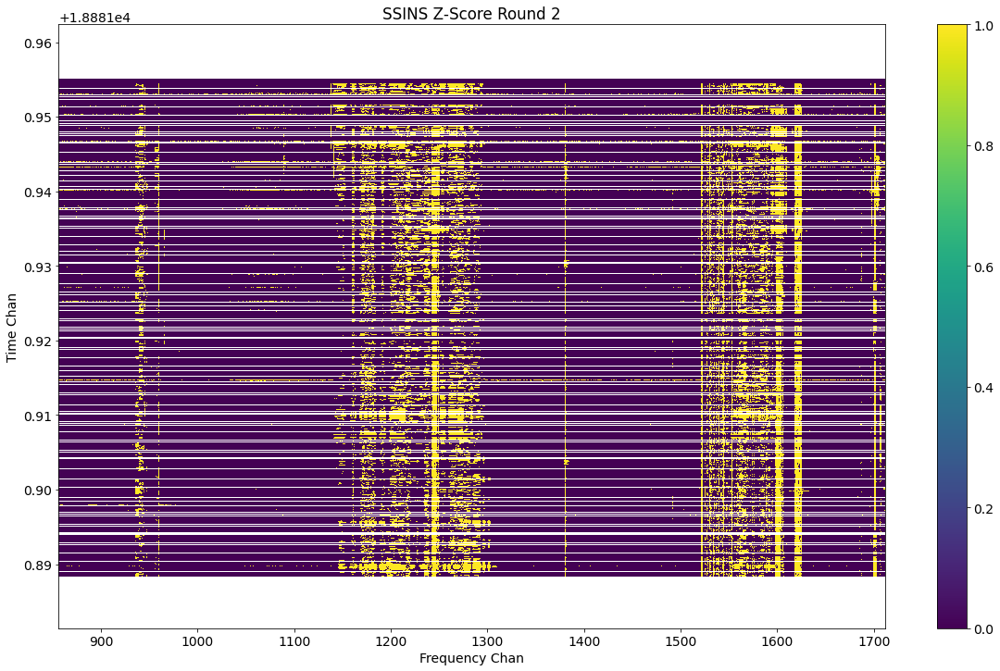

In [89]:
plot_waterfall(ssins_l1_flags_3, Title = 'SSINS Z-Score Round 2', figsize=(20,12), xlabel='Frequency Chan', ylabel='Time Chan', interpolation='none', extent=[freqs[0]/1e6, freqs[-1]/1e6, local_t[0], local_t[-1]])


In [72]:
ssins_l1_flags_only = mask_to_flags_ssins(nd_s0, ants=antenna, zscore_mask=np.logical_or(ssins_l1_zscore_mask, np.logical_or(ssins_l1_2_mask, ssins_l1_3_mask)))

mask2 loaded for dish m000
mask2 loaded for dish m002
mask2 loaded for dish m005
mask2 loaded for dish m008
mask2 loaded for dish m009
mask2 loaded for dish m010
mask2 loaded for dish m011
mask2 loaded for dish m012
mask2 loaded for dish m018
mask2 loaded for dish m021
mask2 loaded for dish m028
mask2 loaded for dish m029
mask2 loaded for dish m040
mask2 loaded for dish m041
mask2 loaded for dish m042
mask2 loaded for dish m046
mask2 loaded for dish m047
mask2 loaded for dish m051
mask2 loaded for dish m053
mask2 loaded for dish m054
mask2 loaded for dish m056
mask2 loaded for dish m057
mask2 loaded for dish m058
mask2 loaded for dish m059
mask2 loaded for dish m061
mask2 loaded for dish m062


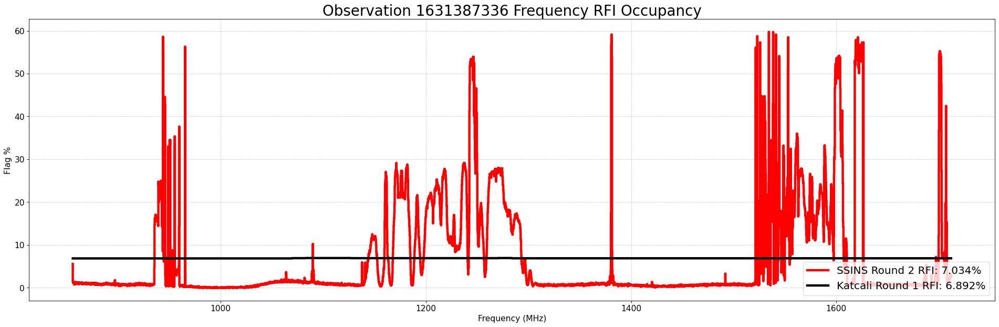

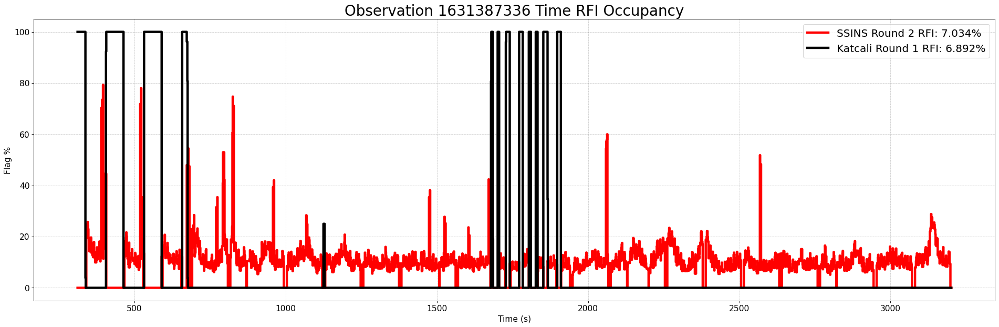

In [73]:
path_l1 = '/idia/projects/hi_im/raw_vis/MeerKLASS2021/level1/mask/checked/'
f = fname
data_file = kio.load_data(f)
freqs = data_file.freqs
chans = data_file.channels
dumps = data_file.dumps

l1_flags, nrec = l1_flags_dict_to_array(fname=f'{f}', pol='h', path=path_l1)
katcali_flag_counts_l1 = count_flags((l1_flags))
ssins_only_flag_counts_l1 = count_flags(ssins_l1_flags_only, nreceiver=nrec)
ssins_f = np.mean(ssins_only_flag_counts_l1['flags_fchan'])
katcali_f = np.mean(katcali_flag_counts_l1['flags_fchan'])

ssins_t = np.mean(ssins_only_flag_counts_l1['flags_tchan'])
katcali_t = np.mean(katcali_flag_counts_l1['flags_tchan'])

plt.figure(figsize=(24, 8), dpi=80)
plt.step(freqs[chans]/1e6, ssins_only_flag_counts_l1['flags_fchan'], label=f'SSINS Round 2 RFI: {ssins_f:.3f}%', linewidth=4, color='r')
plt.step(freqs[chans]/1e6, katcali_flag_counts_l1['flags_fchan'], label=f'Katcali Round 1 RFI: {katcali_f:.3f}%', linewidth=4, color='k')
plt.grid(ls=':', color='#6e6e6e', lw=0.5)
plt.ylabel('Flag %', color='k')
plt.title(f'Observation {f} Frequency RFI Occupancy', fontsize=25)
plt.legend(fontsize=18, labelcolor='k', loc='lower right')
plt.xlabel('Frequency (MHz)', color='k')
plt.tight_layout()
freq_plot_path = os.path.join('plots/ssins_r1/', f'flag_percentage_freq_ssinsround1_{f}.png')
#plt.savefig(freq_plot_path)
plt.show()

# --- Time Plot (tchan) ---
plt.figure(figsize=(24, 8), dpi=80)
plt.step(dumps[nd_s0], ssins_only_flag_counts_l1['flags_tchan'][nd_s0], label=f'SSINS Round 2 RFI: {ssins_t:.3f}%', linewidth=4, color='r')
plt.step(dumps[nd_s0], katcali_flag_counts_l1['flags_tchan'][nd_s0], label=f'Katcali Round 1 RFI: {katcali_t:.3f}%', linewidth=4, color='k')
plt.grid(ls=':', color='#6e6e6e', lw=0.5)
plt.xlabel('Time (s)', color='k')
plt.ylabel('Flag %', color='k')
plt.title(f'Observation {f} Time RFI Occupancy', fontsize=25)
plt.legend(fontsize=18, labelcolor='k', loc='upper right')
plt.tight_layout()
#time_plot_path = os.path.join('plots/ssins_r1/', f'flag_percentage_time_ssinsround1_{f}.png')
#plt.savefig(time_plot_path)
plt.show()

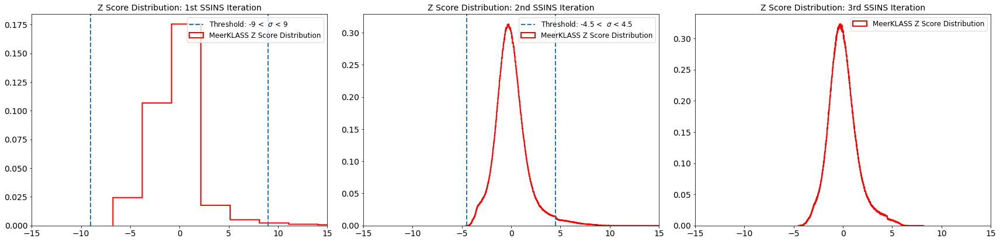

In [93]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Define histogram data and titles
ssins_data = [z_score_map_abba_l1, ssins_2_l1, ssins_3_l1]
titles = [
    'Z Score Distribution: 1st SSINS Iteration',
    'Z Score Distribution: 2nd SSINS Iteration',
    'Z Score Distribution: 3rd SSINS Iteration'
]
bins = [1000, 1000, 1000, 1000]  # Different bin sizes for different iterations

for i, ax in enumerate(axes.flat):
    ax.hist(np.ravel(ssins_data[i]), bins=bins[i], histtype='step', density=True, 
            edgecolor='r', label='MeerKLASS Z Score Distribution', linewidth=2)
    if i == 0:
        ax.axvline(x=-9, ls='--', label='Threshold: -9 <  $\sigma$ < 9', linewidth=2)
        ax.axvline(x=9, ls='--', linewidth=2)
        
    if 0 < i < 2:  # Add vertical threshold lines only for the first two plots
        ax.axvline(x=-4.5, ls='--', label='Threshold: -4.5 <  $\sigma$ < 4.5', linewidth=2)
        ax.axvline(x=4.5, ls='--', linewidth=2)
    
    ax.set_xlim((-15, 15))
    ax.set_title(titles[i], fontsize=14)
    ax.legend(loc= 'upper right', fontsize=12)

plt.tight_layout()
plt.show()


In [75]:
directory = 'meerklass-ssins/ssins_iterative_flags/ssins_level1/'
file_path = os.path.join(directory, f'{fname}_{pol}_ssins_Level1_flags.npy')

# Save the file
with open(file_path, 'wb') as f:
    np.save(f, ssins_l1_flags_only)

FileNotFoundError: [Errno 2] No such file or directory: 'meerklass-ssins/ssins_iterative_flags/ssins_level1/1631387336_h_ssins_Level1_flags.npy'

In [ ]:
"""directory = 'ssins_iterative_flags/ssins_level1/zscore'
file_path = os.path.join(directory, f'{fname}_{pol}_ssins_Level1_zscore.npy')

# Save the file
with open(file_path, 'wb') as f:
    np.save(f, z_score_map_abba_l1 )"""

In [79]:
fload=kio.load_data(fname)
freqs = fload.freqs

bins_set_flux = bins_bdis(sbin_num=800, smax=3e5, smin=10, rfi_bin_num=1000, rfi_max=6e5)
bins_set_flux = np.sort(bins_set_flux)
ant_0 = ants[0]
flux = temp_to_flux(raw_vis_dict[ant0], freqs)

<AxesSubplot:title={'center':'Brightness Distribution of Observation 1631387336'}, xlabel='Flux (Jy)', ylabel='Flux Count'>

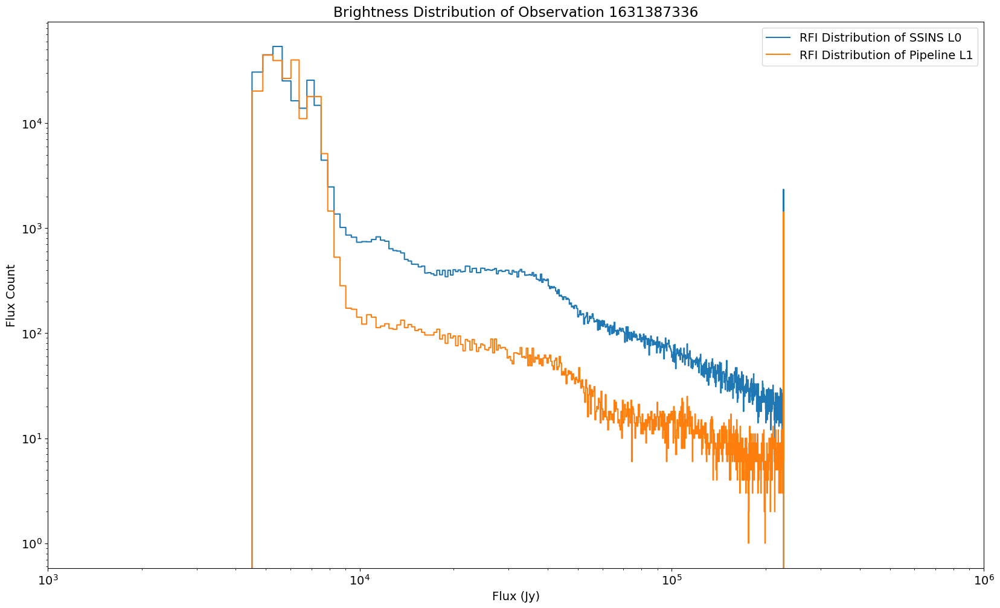

In [80]:
figure, ax = plt.subplots(1, 1 , figsize=(20, 12), dpi=100)

data_flagged_l1 = np.ma.masked_array(data=flux[nd_s0][:, 200:1400], mask=(ssins_l0_flags_only[nd_s0][:, 200:1400]))
mask = data_flagged_l1[:, :].mask
data_rfi = data_flagged_l1.data[mask]

cd_rfi, amp_rfi = np.histogram(data_rfi, bins=bins_set_flux)
plot_bd(fname=fname, data=amp_rfi, cd_data=cd_rfi, label='RFI Distribution of SSINS L0',  ax=ax)


data_flagged_l1 = np.ma.masked_array(data=flux[nd_s0][:, 200:1400], mask=(l1_flags_dict[ant_0][nd_s0][:, 200:1400]))
mask = data_flagged_l1[:, :].mask
data_rfi = data_flagged_l1.data[mask]

cd_rfi, amp_rfi = np.histogram(data_rfi, bins=bins_set_flux)
plot_bd(fname=fname, data=amp_rfi, cd_data=cd_rfi, label='RFI Distribution of Pipeline L1', ax=ax)


<AxesSubplot:title={'center':'Brightness Distribution of Observation 1631387336'}, xlabel='Flux (Jy)', ylabel='Flux Count'>

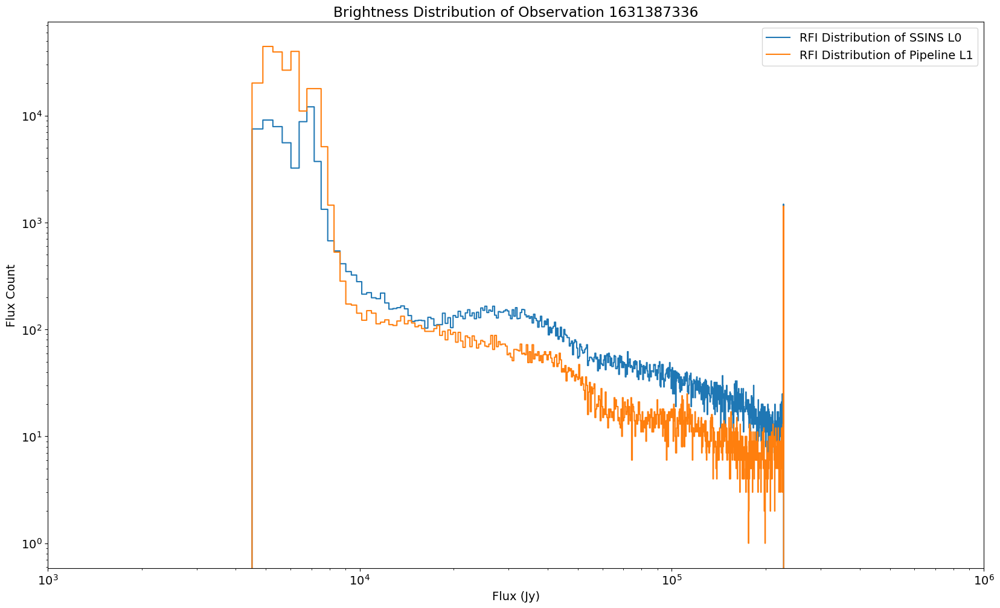

In [95]:
figure, ax = plt.subplots(1, 1 , figsize=(20, 12), dpi=100)

data_flagged_l1 = np.ma.masked_array(data=flux[nd_s0][:, 200:1400], mask=(ssins_l1_flags_only[nd_s0][:, 200:1400]))
mask = data_flagged_l1[:, :].mask
data_rfi = data_flagged_l1.data[mask]

cd_rfi, amp_rfi = np.histogram(data_rfi, bins=bins_set_flux)
plot_bd(fname=fname, data=amp_rfi, cd_data=cd_rfi, label='RFI Distribution of SSINS L0',  ax=ax)


data_flagged_l1 = np.ma.masked_array(data=flux[nd_s0][:, 200:1400], mask=(l1_flags_dict[ant_0][nd_s0][:, 200:1400]))
mask = data_flagged_l1[:, :].mask
data_rfi = data_flagged_l1.data[mask]

cd_rfi, amp_rfi = np.histogram(data_rfi, bins=bins_set_flux)
plot_bd(fname=fname, data=amp_rfi, cd_data=cd_rfi, label='RFI Distribution of Pipeline L1', ax=ax)


In [ ]:
# SSINS for level 2 flagged, do i apply this on the raw visibility or on the level 2 scans 